## 10.4 使用预训练的目标检测网络


**Daitu：2505131775@qq.com**

In [1]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [2]:
## 导入相关模块
import numpy as np
import torchvision
import torch
import torchvision.transforms as transforms
from PIL import Image,ImageDraw,ImageFont
import matplotlib.pyplot as plt

In [3]:
## 导入已经预训练好的Resnet50 Faster R-CNN网络模型，通过COCO数据集进行预训练
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
        )
  

In [4]:
## 定义使用COCO数据集对应的没类的名称
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
# distinct_colors = ['#e6194b', '#3cb44b', '#ffe119', '#0082c8', '#f58231', '#911eb4', '#46f0f0', '#f032e6',
#                    '#d2f53c', '#fabebe', '#008080', '#000080', '#aa6e28', '#fffac8', '#800000', '#aaffc3', '#808000',
#                    '#ffd8b1', '#e6beff', '#808080', '#FFFFFF']

In [5]:
## 准备需要检测的图像
# image = Image.open("data/chap10/2007_001764.jpg")
image = Image.open("data/chap10/2012_004308.jpg") 
# image = Image.open("data/chap10/照片1.jpg") 
transform_d = transforms.Compose([transforms.ToTensor()])
image_t = transform_d(image) # 对图像进行变换
print(image_t.shape)
pred = model([image_t]) # 将模型作用到图像上
pred
## 在pred的输出中，包括：检测到每个目标的边界框（boxes坐标）；目标所属的类别（label）；属于相应类别的得分（scores）

torch.Size([3, 333, 500])


[{'boxes': tensor([[139.2892,  34.5659, 306.4037, 212.7149],
          [ 78.5456, 117.7257, 295.0000, 274.1726],
          [176.4146,  45.9989, 293.7729, 167.6908],
          [446.5353, 298.2009, 482.5390, 332.6683],
          [144.3929,  59.9620, 242.3082, 232.6723],
          [264.5503, 289.4034, 348.2632, 330.4233],
          [ 81.5552, 100.5543, 306.1093, 279.8182],
          [304.1234,  68.3819, 500.0000, 314.6511],
          [247.8653,  79.4176, 495.8732, 322.4384],
          [264.6102, 288.0742, 348.0310, 330.5592]], grad_fn=<StackBackward>),
  'labels': tensor([ 1,  2,  1,  1,  1, 15,  4,  5,  2,  8]),
  'scores': tensor([0.9951, 0.9430, 0.8601, 0.8108, 0.4989, 0.3326, 0.2907, 0.1794, 0.1753,
          0.1197], grad_fn=<IndexBackward>)}]

In [6]:
# ## 针对该输出的结果可以将它们在图像上显示出来
# # 检测出目标的类别和得分
# pred_class = [COCO_INSTANCE_CATEGORY_NAMES[ii] for ii in list(pred[0]['labels'].numpy())] 
# pred_score = list(pred[0]['scores'].detach().numpy())
# # 检测出目标的边界框
# pred_boxes = [[ii[0], ii[1], ii[2], ii[3]] for ii in list(pred[0]['boxes'].detach().numpy())]
# ## 只保留设别的概率大于0.5的结果
# pred_index = [pred_score.index(x) for x in pred_score if x > 0.5 ]
# ## 将检测的结果和图像一起可视化
# draw = ImageDraw.Draw(image)
# for index in pred_index:
#     box = pred_boxes[index]
#     draw.rectangle(box,outline="red")
#     texts = pred_class[index]+":"+str(np.round(pred_score[index],2))
#     draw.text((box[0],box[1]),texts ,fill="red") 
# # 显示图像    
# image

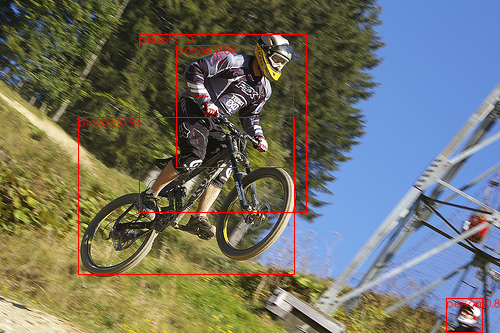

In [7]:
## 针对该输出的结果可以将它们在图像上显示出来
# 检测出目标的类别和得分
pred_class = [COCO_INSTANCE_CATEGORY_NAMES[ii] for ii in list(pred[0]['labels'].numpy())] 
pred_score = list(pred[0]['scores'].detach().numpy())
# 检测出目标的边界框
pred_boxes = [[ii[0], ii[1], ii[2], ii[3]] for ii in list(pred[0]['boxes'].detach().numpy())]
## 只保留设别的概率大于0.5的结果
pred_index = [pred_score.index(x) for x in pred_score if x > 0.5 ]
## 设置图像显示的字体
fontsize = np.int16(image.size[1] / 30) 
font1 = ImageFont.truetype("/Library/Fonts/华文细黑.ttf",fontsize)
##  可视化图像
draw = ImageDraw.Draw(image)
for index in pred_index:
    box = pred_boxes[index]
    draw.rectangle(box,outline="red")
    texts = pred_class[index]+":"+str(np.round(pred_score[index],2))
    draw.text((box[0],box[1]),texts ,fill="red",font=font1) 
# 显示图像    
image

#### 将上述过程定义为一个函数

In [8]:
def Object_Detect(model,image_path,COCO_INSTANCE_CATEGORY_NAMES,threshold=0.5):
    image = Image.open(image_path) 
    transform_d = transforms.Compose([transforms.ToTensor()])
    image_t = transform_d(image) # 对图像进行变换
    pred = model([image_t]) # 将模型作用到图像上
    # 检测出目标的类别和得分
    pred_class = [COCO_INSTANCE_CATEGORY_NAMES[ii] for ii in list(pred[0]['labels'].numpy())] 
    pred_score = list(pred[0]['scores'].detach().numpy())
    # 检测出目标的边界框
    pred_boxes = [[ii[0], ii[1], ii[2], ii[3]] for ii in list(pred[0]['boxes'].detach().numpy())]
    ## 只保留设别的概率大于0.5的结果
    pred_index = [pred_score.index(x) for x in pred_score if x > threshold ]
    ## 设置图像显示的字体
    fontsize = np.int16(image.size[1] / 30) 
    font1 = ImageFont.truetype("/Library/Fonts/华文细黑.ttf",fontsize)
    ## 将检测的结果和图像一起可视化
    draw = ImageDraw.Draw(image)
    for index in pred_index:
        box = pred_boxes[index]
        draw.rectangle(box,outline="red")
        texts = pred_class[index]+":"+str(np.round(pred_score[index],2))
        draw.text((box[0],box[1]),texts ,fill="red",font=font1) 
    return image


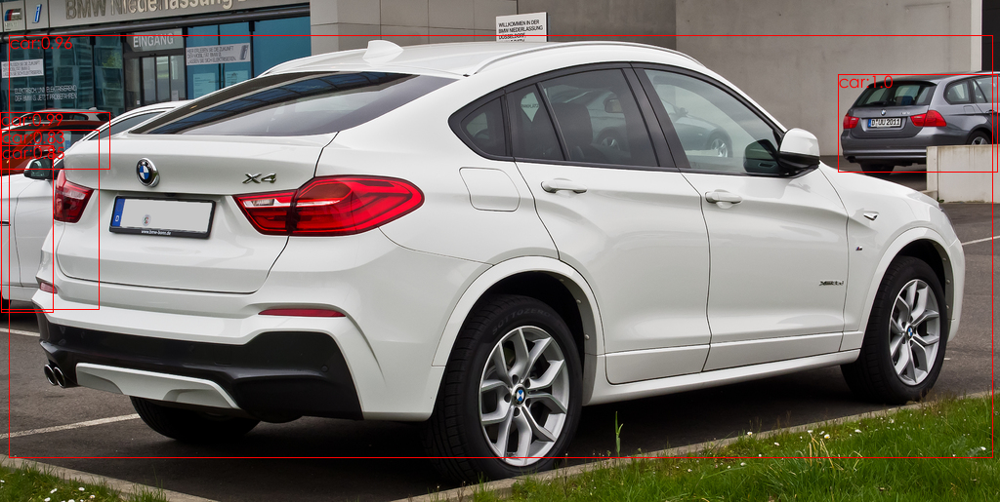

In [9]:
## 调用上面的函数
image_path = "data/chap10/car.jpg"
Object_Detect(model,image_path,COCO_INSTANCE_CATEGORY_NAMES)

### 人体关键点检测

In [10]:
## 导入已经预训练好的keypoint R-CNN网络模型，通过COCO数据集进行预训练
model = torchvision.models.detection.keypointrcnn_resnet50_fpn(pretrained=True)
model.eval()

KeypointRCNN(
  (transform): GeneralizedRCNNTransform()
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d()
      (relu): ReLU(inplace)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d()
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d()
          (relu): ReLU(inplace)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d()
          )
        )


In [11]:
## 定义使用COCO数据集对应的没类的名称
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]
## 定义能够检测出的关键点名称
COCO_PERSON_KEYPOINT_NAMES = ['nose','left_eye','right_eye','left_ear',
    'right_ear','left_shoulder','right_shoulder','left_elbow',
    'right_elbow','left_wrist','right_wrist','left_hip','right_hip',
    'left_knee','right_knee','left_ankle','right_ankle'
]

In [12]:
## 准备需要检测的图像
image = Image.open("data/chap10/woman sport.jpg") 
transform_d = transforms.Compose([transforms.ToTensor()])
image_t = transform_d(image) # 对图像进行变换
print(image_t.shape)
pred = model([image_t]) # 将模型作用到图像上
pred
## 在pred的结果中：
## boxes : 检测出的目标的位置;labels: 检测出的目标的分类;scores: 检测出的目标为对应分类的得分;
## keypoints: K个关键点为N个实例中每个实例（ 检测出的目标）的位置，
## 格式为[x，y，visibility]，其中visibility = 0表示关键点不可见。
## keypoints_scores

torch.Size([3, 1239, 1920])


[{'boxes': tensor([[ 347.3730,  224.8462, 1077.5818, 1176.9193],
          [ 621.4616,  223.8086, 1052.7462,  969.2892],
          [ 734.5590,  331.9993,  807.3549,  414.4977]], grad_fn=<StackBackward>),
  'keypoints': tensor([[[9.1901e+02, 3.4637e+02, 1.0000e+00],
           [9.2520e+02, 3.3089e+02, 1.0000e+00],
           [9.0973e+02, 3.2470e+02, 1.0000e+00],
           [8.6486e+02, 3.0922e+02, 1.0000e+00],
           [8.6332e+02, 3.0922e+02, 1.0000e+00],
           [8.7105e+02, 4.1603e+02, 1.0000e+00],
           [8.0298e+02, 4.1139e+02, 1.0000e+00],
           [8.9890e+02, 5.4917e+02, 1.0000e+00],
           [6.7148e+02, 5.1202e+02, 1.0000e+00],
           [1.0010e+03, 6.6373e+02, 1.0000e+00],
           [6.4827e+02, 6.6528e+02, 1.0000e+00],
           [7.9215e+02, 6.6218e+02, 1.0000e+00],
           [7.7823e+02, 6.4980e+02, 1.0000e+00],
           [6.5601e+02, 8.8820e+02, 1.0000e+00],
           [9.3448e+02, 8.6808e+02, 1.0000e+00],
           [4.2395e+02, 8.8665e+02, 1.0000e+00],

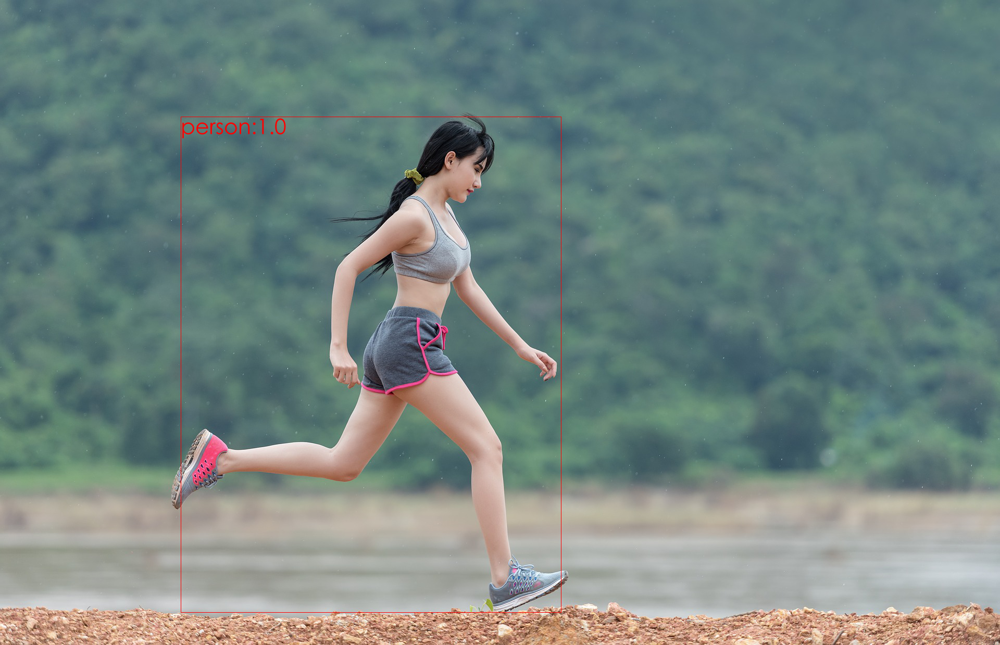

In [13]:
# 检测出目标的类别和得分
pred_class = [COCO_INSTANCE_CATEGORY_NAMES[ii] for ii in list(pred[0]['labels'].numpy())] 
pred_score = list(pred[0]['scores'].detach().numpy())
# 检测出目标的边界框
pred_boxes = [[ii[0], ii[1], ii[2], ii[3]] for ii in list(pred[0]['boxes'].detach().numpy())]
## 只保留设别的概率大于0.5的结果
pred_index = [pred_score.index(x) for x in pred_score if x > 0.5 ]
## 设置图像显示的字体
fontsize = np.int16(image.size[1] / 30) 
font1 = ImageFont.truetype("/Library/Fonts/华文细黑.ttf",fontsize)
##  可视化图像
image2 = image.copy()
draw = ImageDraw.Draw(image2)
for index in pred_index:
    box = pred_boxes[index]
    draw.rectangle(box,outline="red")
    texts = pred_class[index]+":"+str(np.round(pred_score[index],2))
    draw.text((box[0],box[1]),texts ,fill="red",font=font1) 
# 显示图像    
image2

In [14]:
# 因为检测出的3个实例中只有第一个实例的是可信的，
## 所以相应的也只有第一个实例的关键点可信
pred_index = [pred_score.index(x) for x in pred_score if x > 0.5 ]
pred_keypoint = pred[0]["keypoints"]
## 检测到实例的关键点
pred_keypoint = pred_keypoint[pred_index].detach().numpy()
print(pred_keypoint.shape)

(1, 17, 3)


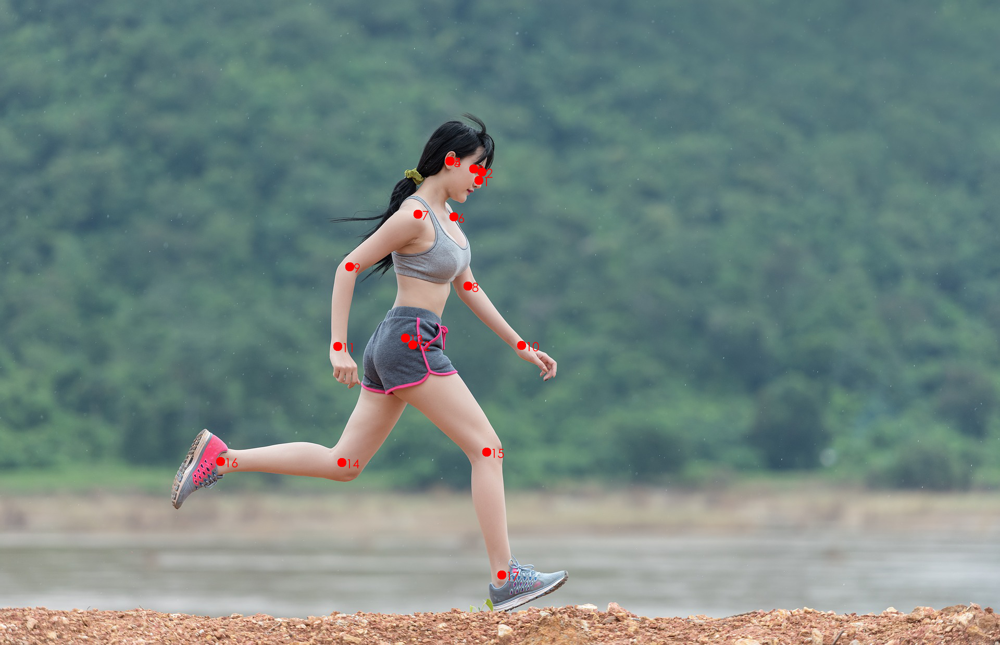

In [15]:
## 可视化出关键点的位置
fontsize = np.int16(image.size[1] / 50) 
r = np.int16(image.size[1] / 150)   ## 圆的半径
font1 = ImageFont.truetype("/Library/Fonts/华文细黑.ttf",fontsize)
##  可视化图像
image3 = image.copy()
draw = ImageDraw.Draw(image3)
## 对实例数量索引
for index in range(pred_keypoint.shape[0]):
    ## 对每个实例的关键点索引
    keypoints = pred_keypoint[index]
    for ii in range(keypoints.shape[0]):
        x = keypoints[ii,0]
        y = keypoints[ii,1]
        visi = keypoints[ii,2]
        if visi > 0 :
            draw.ellipse(xy=(x-r,y-r,x+r,y+r),fill=(255,0,0))
            texts = str(ii+1)
            draw.text((x+r,y-r),texts ,fill="red",font=font1) 
# 显示图像    
image3

In [16]:
## 将上述过程定义为一个函数
def ketpoints_Detect(model,image_path,COCO_INSTANCE_CATEGORY_NAMES,
                     COCO_PERSON_KEYPOINT_NAMES,threshold=0.5):
    image = Image.open(image_path) 
    transform_d = transforms.Compose([transforms.ToTensor()])
    image_t = transform_d(image) # 对图像进行变换
    pred = model([image_t]) # 将模型作用到图像上
    # 检测出目标的类别和得分
    pred_class = [COCO_INSTANCE_CATEGORY_NAMES[ii] for ii in list(pred[0]['labels'].numpy())] 
    pred_score = list(pred[0]['scores'].detach().numpy())
    # 检测出目标的边界框
    pred_boxes = [[ii[0], ii[1], ii[2], ii[3]] for ii in list(pred[0]['boxes'].detach().numpy())]
    ## 只保留设别的概率大于0.5的结果
    pred_index = [pred_score.index(x) for x in pred_score if x > threshold ]
    ## 设置图像显示的字体
    fontsize = np.int16(image.size[1] / 30) 
    font1 = ImageFont.truetype("/Library/Fonts/华文细黑.ttf",fontsize)
    ##  可视化检测出的目标
    image2 = image.copy()
    draw = ImageDraw.Draw(image2)
    for index in pred_index:
        box = pred_boxes[index]
        draw.rectangle(box,outline="red")
        texts = pred_class[index]+":"+str(np.round(pred_score[index],2))
        draw.text((box[0],box[1]),texts ,fill="red",font=font1) 
        
    ## 检测到实例的关键点
    pred_keypoint = pred[0]["keypoints"]
    pred_keypoint = pred_keypoint[pred_index].detach().numpy()
    ## 可视化出关键点的位置
    fontsize = np.int16(image.size[1] / 50) 
    r = np.int16(image.size[1] / 150)   ## 圆的半径
    font1 = ImageFont.truetype("/Library/Fonts/华文细黑.ttf",fontsize)
    ##  可视化图像关键点
    draw = ImageDraw.Draw(image2)
    ## 对实例数量索引
    for index in range(pred_keypoint.shape[0]):
        ## 对每个实例的关键点索引
        keypoints = pred_keypoint[index]
        for ii in range(keypoints.shape[0]):
            x = keypoints[ii,0]
            y = keypoints[ii,1]
            visi = keypoints[ii,2]
            if visi > 0 :
                draw.ellipse(xy=(x-r,y-r,x+r,y+r),fill=(255,0,0))
                texts = str(ii+1)
                draw.text((x+r,y-r),texts ,fill="red",font=font1) 
    # 显示图像    
    image2
    
    # 显示图像    
    return image2


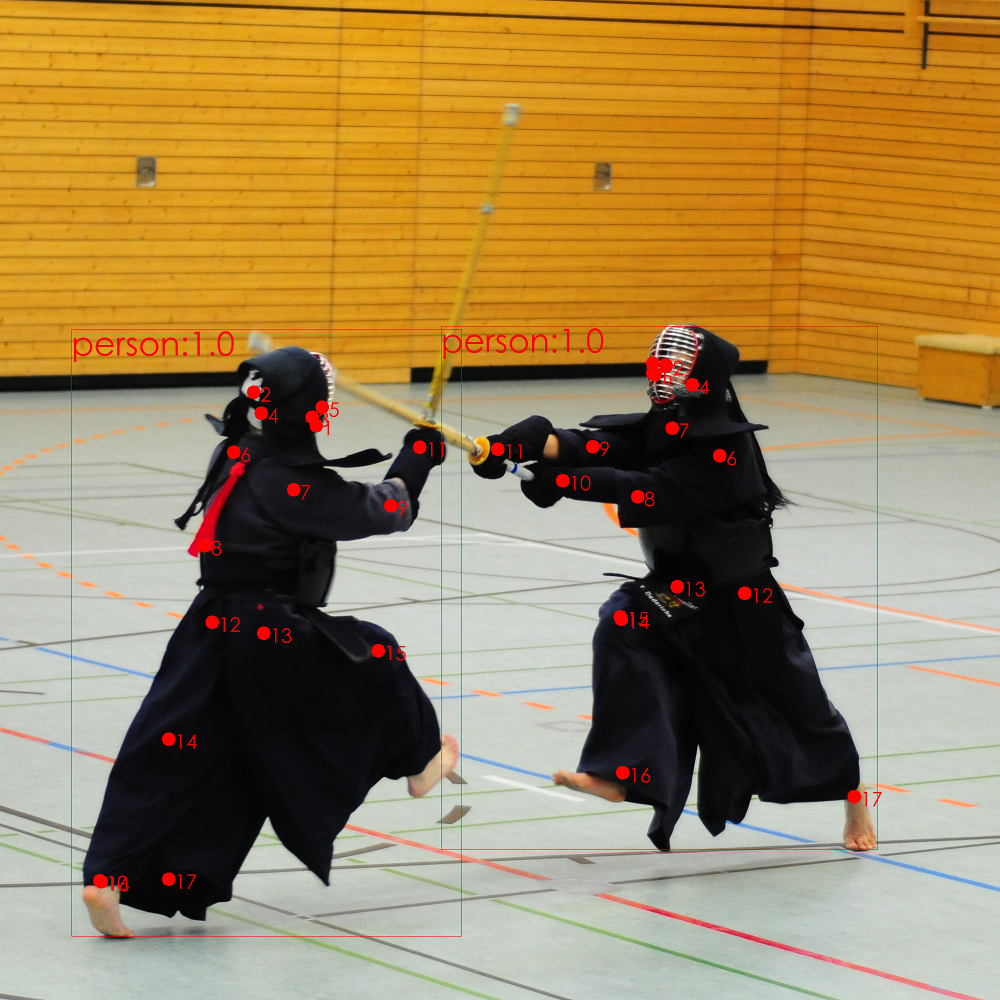

In [17]:
## 调用上面的函数
image_path = "data/chap10/kendo2person.jpg"
image = ketpoints_Detect(model,image_path,COCO_INSTANCE_CATEGORY_NAMES,
                         COCO_PERSON_KEYPOINT_NAMES,threshold=0.8)
image

## 可以发现，针对动作复杂，服饰宽松的人物，关键点的位置有些会出现错误，例如头部关键点完全找不到位置